In [1]:
from pathlib import Path
import json
import re
import numpy as np
from tqdm import tqdm
import string
from PIL import Image
import matplotlib.pyplot as plt

num_episodes = 1000

aud_files = Path("../../../Datasets/flickr_audio")
ss_save_fn = '../support_set/support_set.npz'
image_base = Path('../../../Datasets/Flicker8k_Dataset')
support_set = np.load(ss_save_fn, allow_pickle=True)['support_set'].item()
val_fn = Path('../data/test.json')
val = {}

vocab = []
with open('../data/test_keywords.txt', 'r') as f:
    for keyword in f:
        vocab.append(' '.join(keyword.split()))


alignments = {}
prev = ''
prev_wav = ''
prev_start = 0
with open(aud_files / 'flickr_8k.ctm', 'r') as f:
    for line in f:
        name, _, start, dur, label = line.strip().split()
        wav = name.split('.')[0] + '_' + name.split('#')[-1]
        label = label.lower()
        if label in vocab:
            if wav not in alignments: alignments[wav] = {}
            if label not in alignments[wav]: alignments[wav][label] = (float(start), float(start) + float(dur))
        prev = label
        prev_wav = wav
        prev_start = start

s_imgs = []
s_wavs = []

for wav_name in tqdm(support_set):

    wav, img, yor, start, dur, word, _, _, _ = support_set[wav_name]
    s_wavs.append(Path(wav).stem)
    s_imgs.append(Path(img).stem)

with open(val_fn, 'r') as f:
    val = json.load(f)

data = []
words2imgs = {}
words2aud = {}
for w in val:
    for im, eng, yor in val[w]:
        data.append((im, eng, yor, w))
        if w not in words2imgs: words2imgs[w] = []
        words2imgs[w].append(Path(im).stem)
        if w not in words2aud: words2aud[w] = []
        words2aud[w].append(Path(eng).stem)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 97541.95it/s]


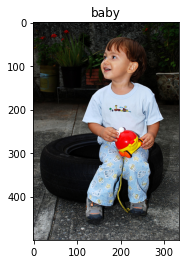

y


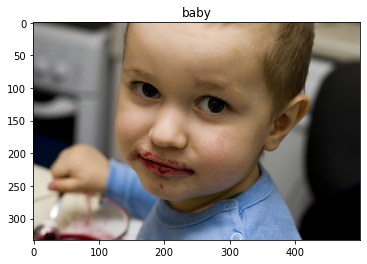

y


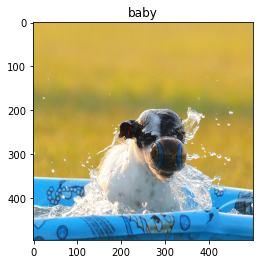

n


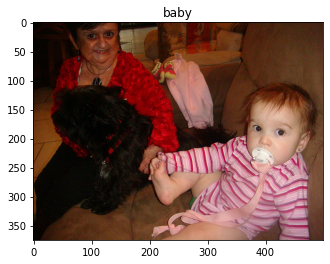

y


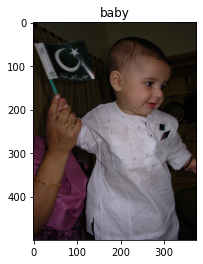

y


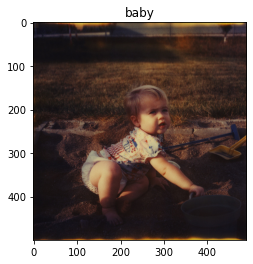

y


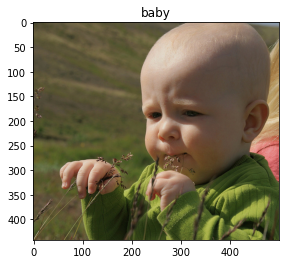

y


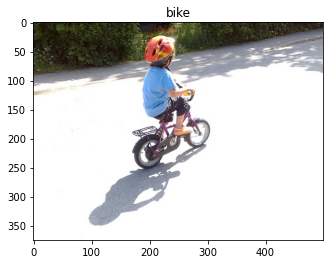

y


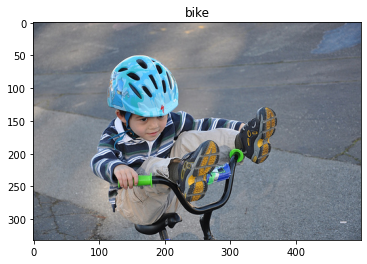

n


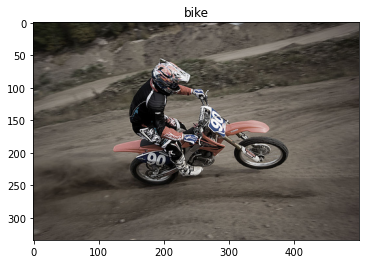

y


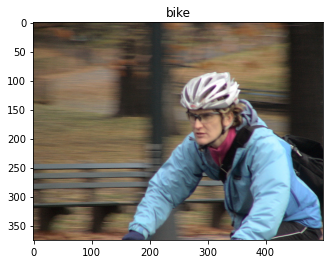

n


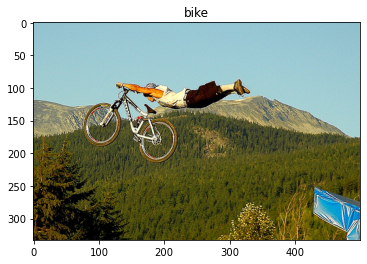

y


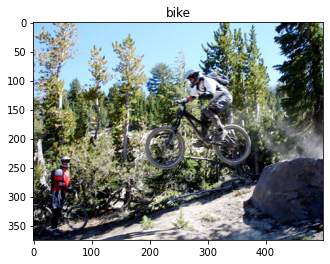

y


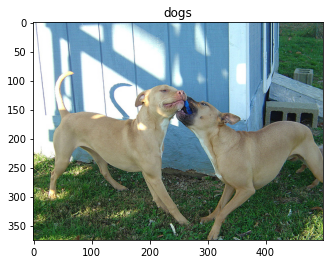

y


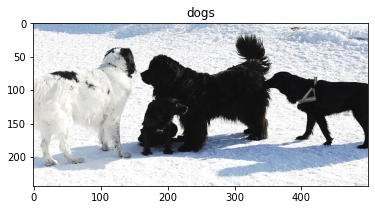

y


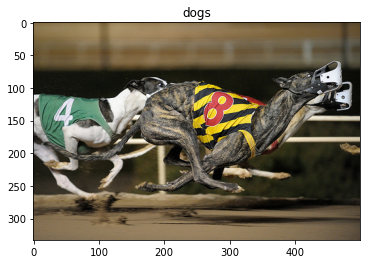

n


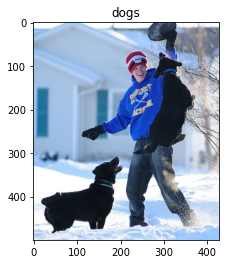

y


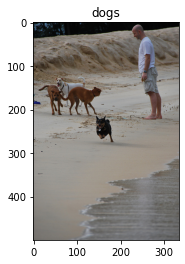

y


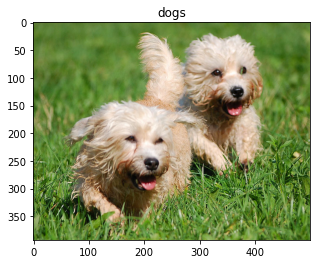

y


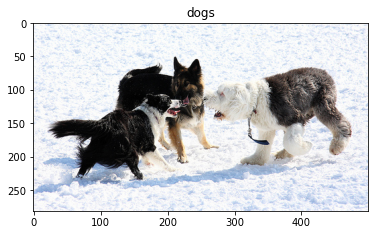

y


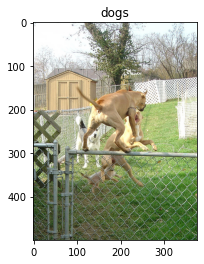

y


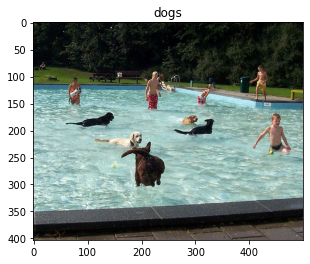

n


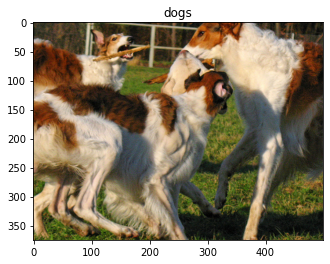

n


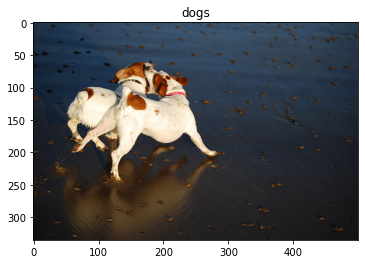

y


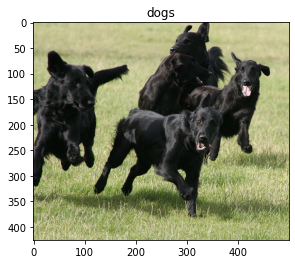

y


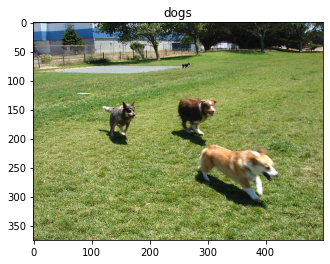

y


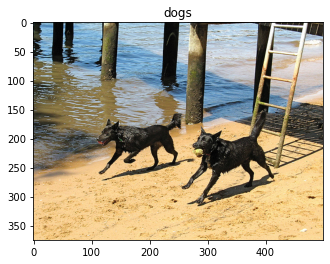

y


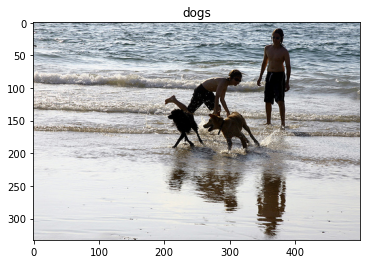

n


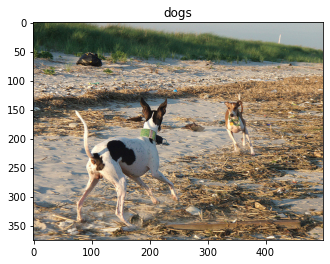

y


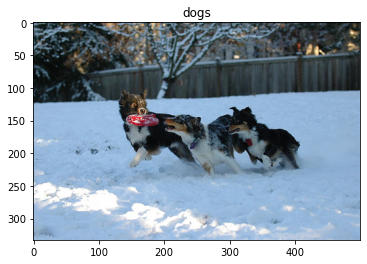

y


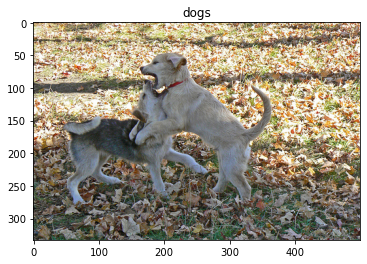

y


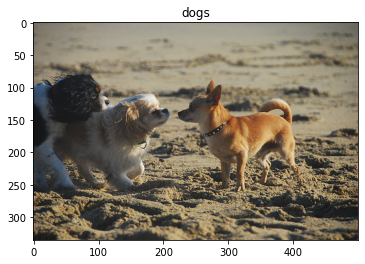

y


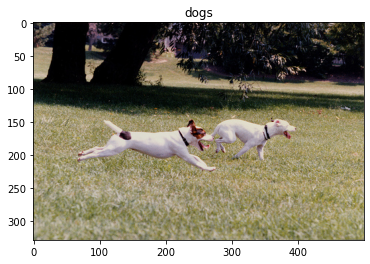

y


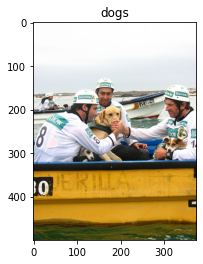

n


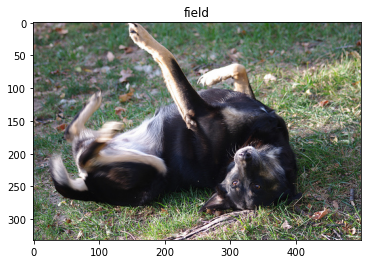

y


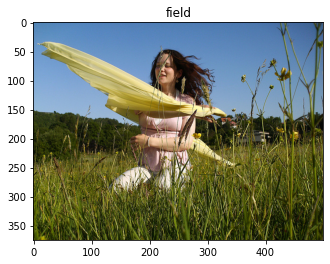

y


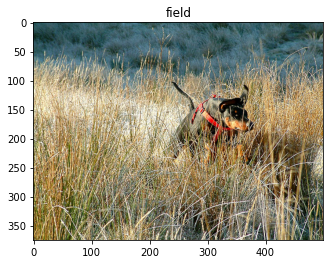

n


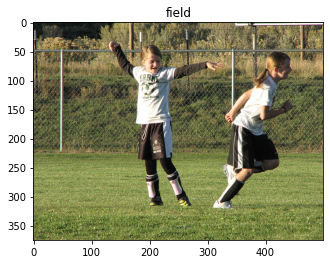

y


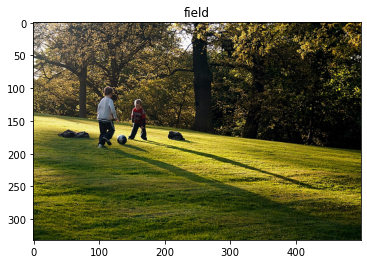

n


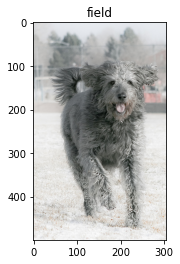

y


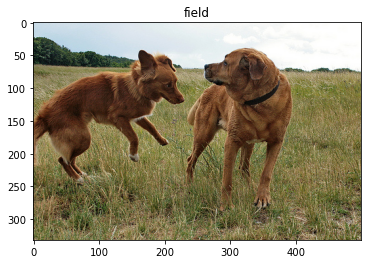

y


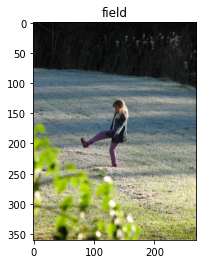

n


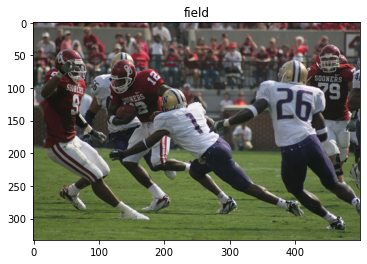

y


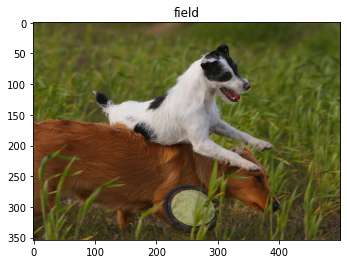

n


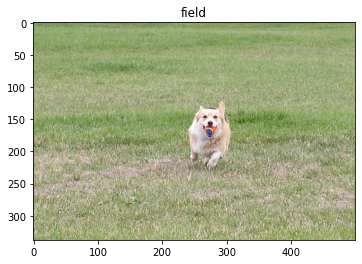

n


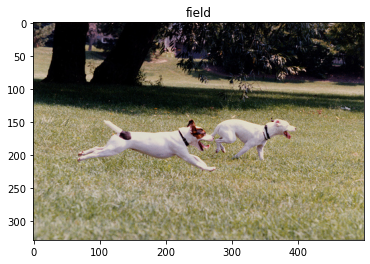

n


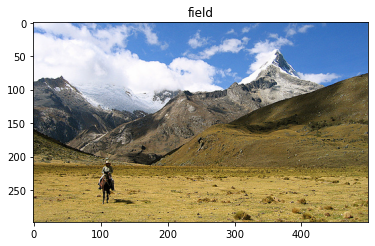

n


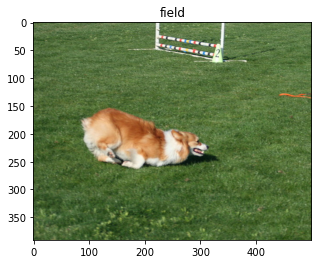

n


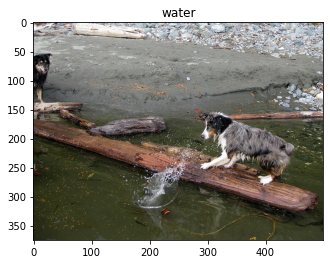

n


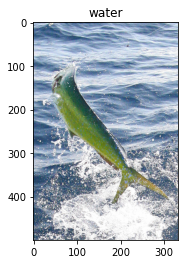

y


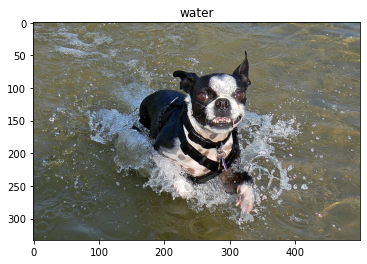

n


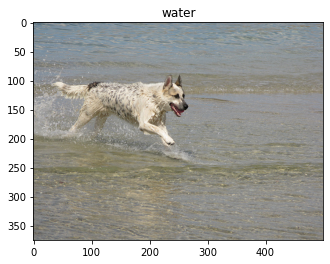

n


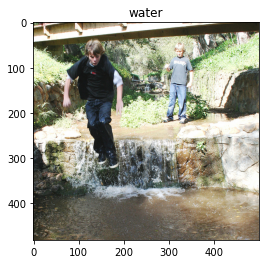

y


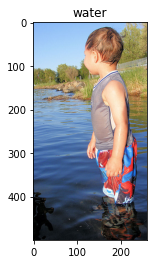

n


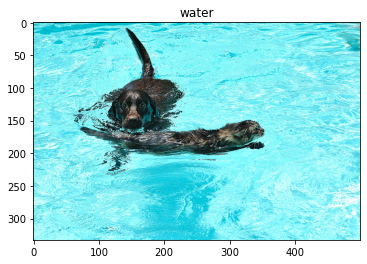

n


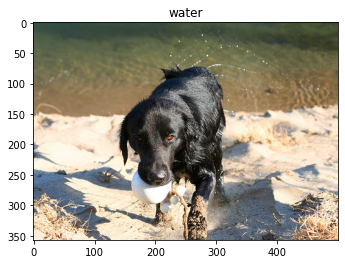

n


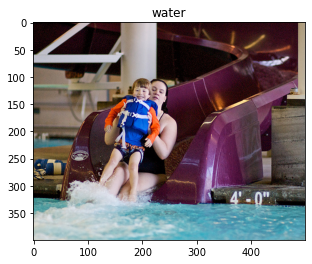

y


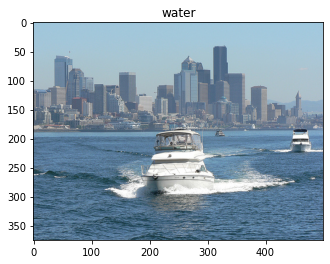

y


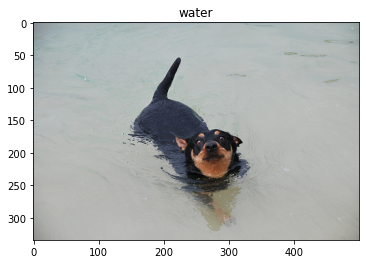

n


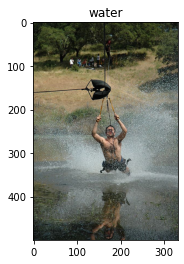

y


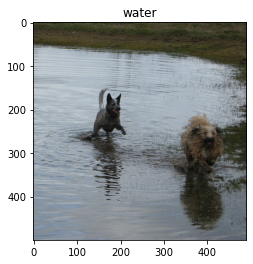

n


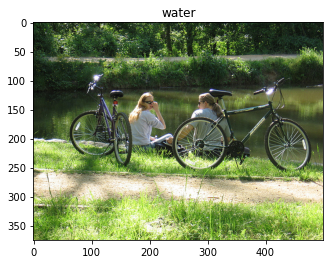

n


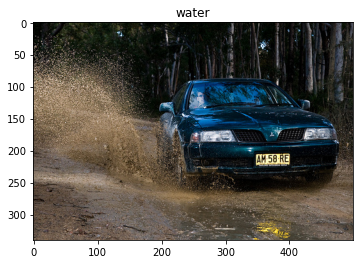

n


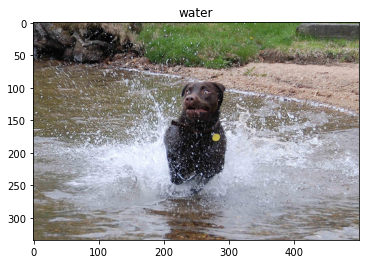

n


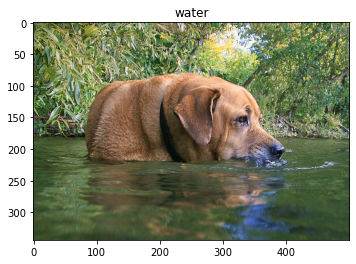

n


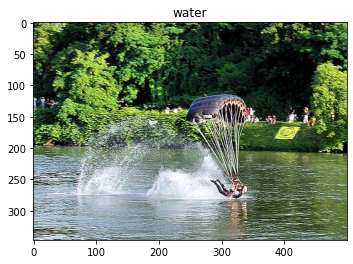

y


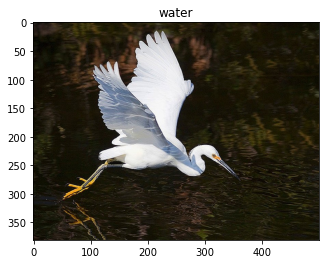

n


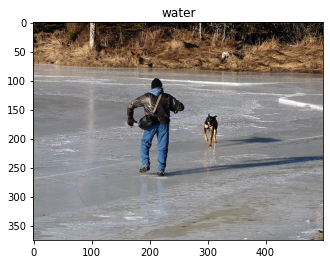

n


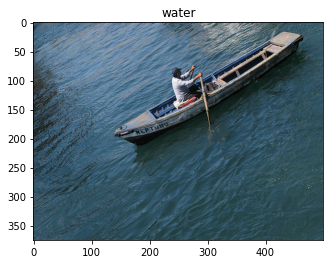

y


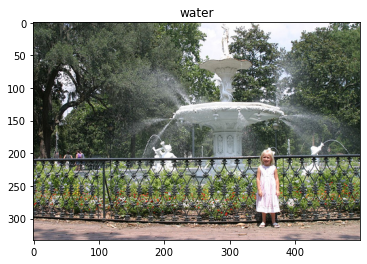

n


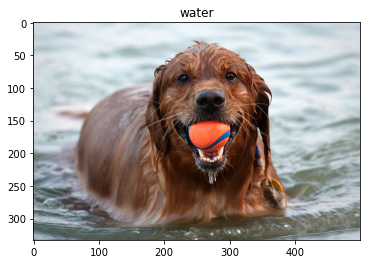

n


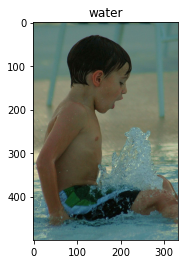

n


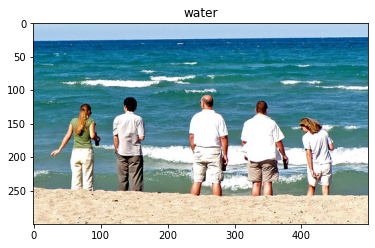

y


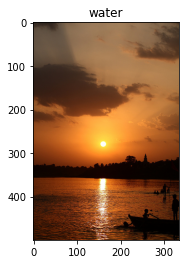

y


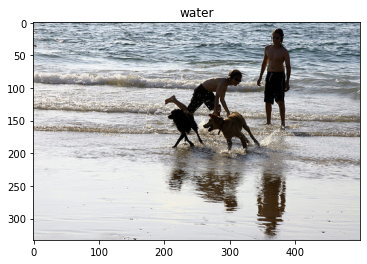

n


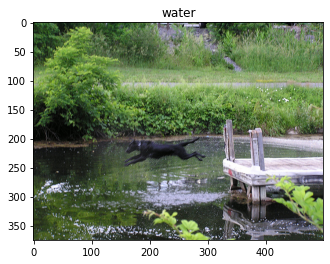

n


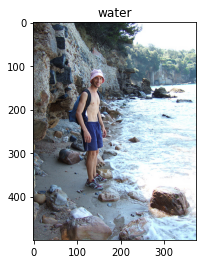

y


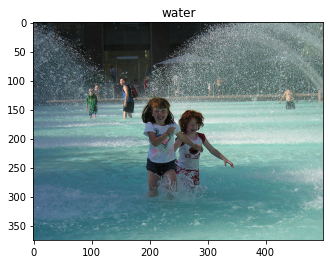

n


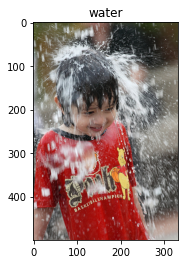

n


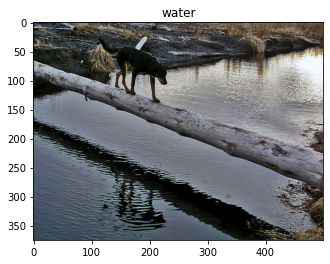

n


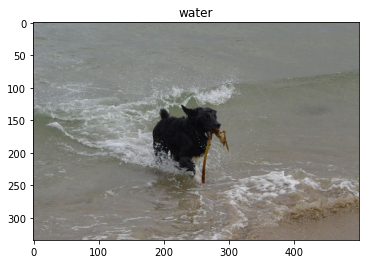

n


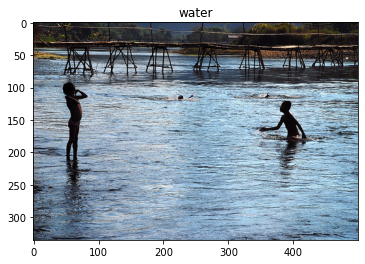

y


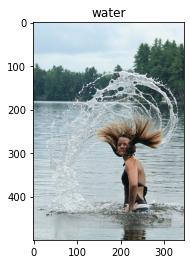

y


In [2]:
images = {}
for word in vocab:
    for im in words2imgs[word]:
        impath = image_base / Path(str(im) + '.jpg') 
        
        img = Image.open(impath).convert('RGB')
        plt.title(word)
        plt.imshow(img)
  
        plt.show()
        choice = input()
        if choice == 'y':
            if word not in images: images[word] = []
            images[word].append(im)

In [3]:
test_save_fn = '../data/test_episodes_images'
np.savez_compressed(
    Path(test_save_fn).absolute(), 
    images=images
    )

In [4]:
images.keys()

dict_keys(['baby', 'bike', 'dogs', 'field', 'water'])